# Hands-on Activity 4.1: Advanced Data Analytics and Machine Learning

| name| course/section | date submitted | date performed |
|---|---|---|---|
| John Edward Binay | CPE 019-CPE32S2| 2022-02-26 | 2020-02-26 |

In [1]:
#Import the libraries and dataset
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [2]:
df_all = pd.read_csv(r"C:\Users\core i5\Documents\GitHub\DataScience\datascience\CPE 019\titanic_all.csv")
df_test = pd.read_csv(r"C:\Users\core i5\Documents\GitHub\DataScience\datascience\CPE 019\titanic_test.csv")
df_train = pd.read_csv(r"C:\Users\core i5\Documents\GitHub\DataScience\datascience\CPE 019\titanic_train.csv")

In [3]:
print(df_train.shape[0]/df_all.shape[0])

0.6811926605504587


Since the train dataset is about 70 percent of the df_all dataset we will train-test split the df_all into 70% train and 30% test. We will not use the test set since we don't have the "survive column" and we cannot map out the survive column of the df_all set to the datapoints in the test set. 

## Exploratory Data Analysis

In [4]:
df_all.head()

,Passenger,Survived,Pclass,Name,Gender,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,1,1,"Allen, Miss. Elisabeth Walton",female,29.0000,0,0,24160,211.3375,B5,S
1,2,1,1,"Allison, Master. Hudson Trevor",male,0.9167,1,2,113781,151.5500,C22 C26,S
2,3,0,1,"Allison, Miss. Helen Loraine",female,2.0000,1,2,113781,151.5500,C22 C26,S
3,4,0,1,"Allison, Mr. Hudson Joshua Creighton",male,30.0000,1,2,113781,151.5500,C22 C26,S
4,5,0,1,"Allison, Mrs. Hudson J C (Bessie Waldo Daniels)",female,25.0000,1,2,113781,151.5500,C22 C26,S


In [5]:
df_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1308 entries, 0 to 1307
Data columns (total 12 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Passenger  1308 non-null   int64  
 1   Survived   1308 non-null   int64  
 2   Pclass     1308 non-null   int64  
 3   Name       1308 non-null   object 
 4   Gender     1308 non-null   object 
 5   Age        1045 non-null   float64
 6   SibSp      1308 non-null   int64  
 7   Parch      1308 non-null   int64  
 8   Ticket     1308 non-null   object 
 9   Fare       1308 non-null   float64
 10  Cabin      295 non-null    object 
 11  Embarked   1306 non-null   object 
dtypes: float64(2), int64(5), object(5)
memory usage: 122.8+ KB


We can see that the columns of Age, Cabin, and Embarked are missing some values. Sinc Cabin is missing a lot of values, we should just drop it. We also need to drop name and Passenger since those columns are irrelevant. Let us drop the columns as well as the remaining rows with missing data and see how much data we have left.

In [6]:
df_all.drop(['Passenger','Name','Cabin'],axis=1,inplace=True)

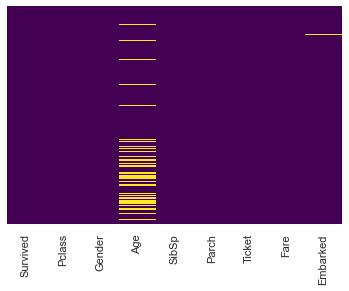

In [7]:
sns.heatmap(df_all.isnull(),yticklabels=False,cbar=False,cmap='viridis');

It seems we still have a few missing values, more so in the Age column and only 1 in the Embarked column

In [8]:
df_all_v1 = df_all.dropna(axis = 0)
df_all_v1.shape

(1043, 9)

In [9]:
df_all_v1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1043 entries, 0 to 1307
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Survived  1043 non-null   int64  
 1   Pclass    1043 non-null   int64  
 2   Gender    1043 non-null   object 
 3   Age       1043 non-null   float64
 4   SibSp     1043 non-null   int64  
 5   Parch     1043 non-null   int64  
 6   Ticket    1043 non-null   object 
 7   Fare      1043 non-null   float64
 8   Embarked  1043 non-null   object 
dtypes: float64(2), int64(4), object(3)
memory usage: 81.5+ KB


<AxesSubplot:xlabel='Survived', ylabel='count'>

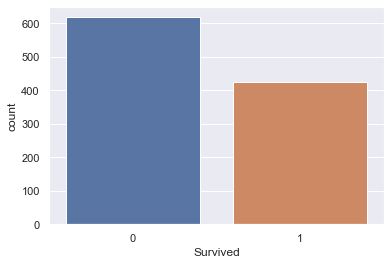

In [10]:
sns.countplot(x='Survived',data=df_all_v1)

It seems there are rougly 200 more passengers that dies than survived.

<AxesSubplot:xlabel='Survived', ylabel='count'>

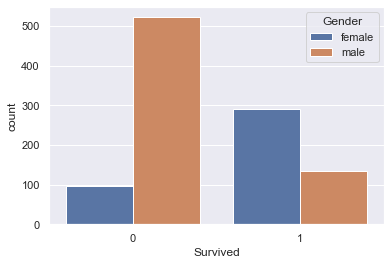

In [11]:
sns.countplot(x='Survived',data=df_all_v1, hue = "Gender")

Significantly more males died than survived, and the opposite is true for females. If our passenger is female, it may be the case that the passenger could have likely survived. Also comparing the male and female mortality, it seems more males died.

<AxesSubplot:xlabel='Survived', ylabel='count'>

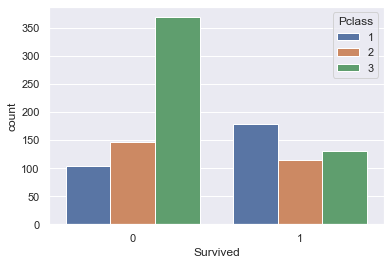

In [12]:
sns.countplot(x='Survived',data=df_all_v1, hue = "Pclass")

If you are of Pclass 3, you would have likely died compared to the other passengers that are in other Pclass membership. It isn't clear if having Pclass 2 could predict survival since the amounts of people in Pclass 2 that died and survived are almost the same. For P1, the diference between survuved and not survived is still somewhat close but certainly not as obvious as the stats for Pclass 3.

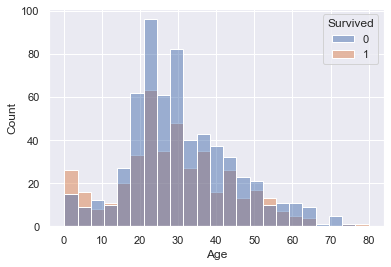

In [13]:
sns.histplot(x=df_all_v1.Age, hue=df_all_v1.Survived);

We can see that it seems most people that died are in the mid-range age. From 15 - 20, most people died than survived. The highest fatalities relevant to survival is in the age range of 20 - 40. More than half of people at 40 and 60 above died. It seems the only ages where we see more survivors than deaths are 0-15 and people a bit older than 50. 

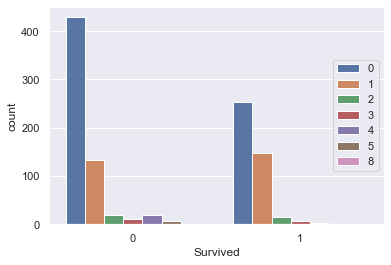

In [14]:
sns.countplot(x='Survived',data=df_all_v1, hue = "SibSp")
plt.legend(loc="right")

Most of the ones that died belong in SiSip 0 and 1. The same can be said for the ones that survived. 

<AxesSubplot:xlabel='Survived', ylabel='count'>

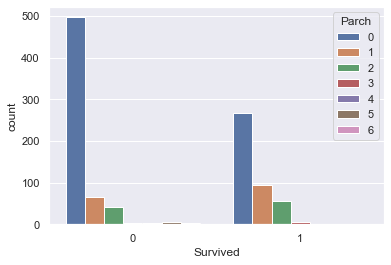

In [15]:
sns.countplot(x='Survived',data=df_all_v1, hue = "Parch")

Parch 0, 1, and 2 are the top 3 categories under Parch that titanic people are associated with that either died or survived. It seems more people under Parch 0 died compared to 

5   Parch     1043 non-null   int64  
 6   Ticket    1043 non-null   object 
 7   Fare      1043 non-null   float64
 8   Embarked  1043 non-null   object 

We have 3 object type columns. Let us see what their unique values are.

In [16]:
df_all_v1_obj_cols = df_all_v1.select_dtypes(include=['object']).columns
for i in df_all_v1_obj_cols:
    print(df_all_v1[i].value_counts())

male      657
female    386
Name: Gender, dtype: int64
CA 2144               8
347082                7
S.O.C. 14879          7
PC 17608              7
3101295               7
                     ..
250646                1
SOTON/O.Q. 3101263    1
29108                 1
350043                1
347060                1
Name: Ticket, Length: 730, dtype: int64
S    781
C    212
Q     50
Name: Embarked, dtype: int64


I do not want to deal with the Ticket column since not only is it categrical but the amount of unique values is very high. It would not make sense to transform the column into an ordinal column since there is no clear ranking in the values. Creating dummy variables (or one-hot encoding) this column will generate way too many columns. For now we will drop it

In [17]:
df_all_v1.drop(['Ticket'] , axis=1, inplace=True)

C:\Users\core i5\Documents\GitHub\DataScience\pyenv\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


# Part 1: Simple Linear Regression

Okay, it seems we still have a lot of data to work with. Linear Regression works best with continous variables. Since we have a categorical variable, we will need to transform the categorical variable into a ordinal variable. We will use the map function for this.

In [18]:
ports = {"male": 0, "female":1}
df_all_v1_copy = df_all_v1.copy()
df_all_v1_copy["Gender"] = df_all_v1_copy["Gender"].map(ports)

In [19]:
ports_embarked = {"S": 0, "C":1 , "Q":2}
df_all_v1_copy["Embarked"] = df_all_v1_copy["Embarked"].map(ports_embarked)

In [20]:
df_all_v1_copy

,Survived,Pclass,Gender,Age,SibSp,Parch,Fare,Embarked
0,1,1,1,29.0000,0,0,211.3375,0
1,1,1,0,0.9167,1,2,151.5500,0
2,0,1,1,2.0000,1,2,151.5500,0
3,0,1,0,30.0000,1,2,151.5500,0
4,0,1,1,25.0000,1,2,151.5500,0
...,...,...,...,...,...,...,...,...
1300,0,3,0,45.5000,0,0,7.2250,1
1303,0,3,1,14.5000,1,0,14.4542,1
1305,0,3,0,26.5000,0,0,7.2250,1
1306,0,3,0,27.0000,0,0,7.2250,1


In [21]:
df_all_v1_copy.describe()

,Survived,Pclass,Gender,Age,SibSp,Parch,Fare,Embarked
count,1043.000000,1043.000000,1043.000000,1043.000000,1043.000000,1043.000000,1043.000000,1043.000000
mean,0.407478,2.209012,0.370086,29.813199,0.504314,0.421860,36.603024,0.299137
std,0.491601,0.840685,0.483059,14.366261,0.913080,0.840655,55.753648,0.553014
min,0.000000,1.000000,0.000000,0.166700,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,0.000000,21.000000,0.000000,0.000000,8.050000,0.000000
50%,0.000000,2.000000,0.000000,28.000000,0.000000,0.000000,15.750000,0.000000
75%,1.000000,3.000000,1.000000,39.000000,1.000000,1.000000,35.077100,1.000000
max,1.000000,3.000000,1.000000,80.000000,8.000000,6.000000,512.329200,2.000000


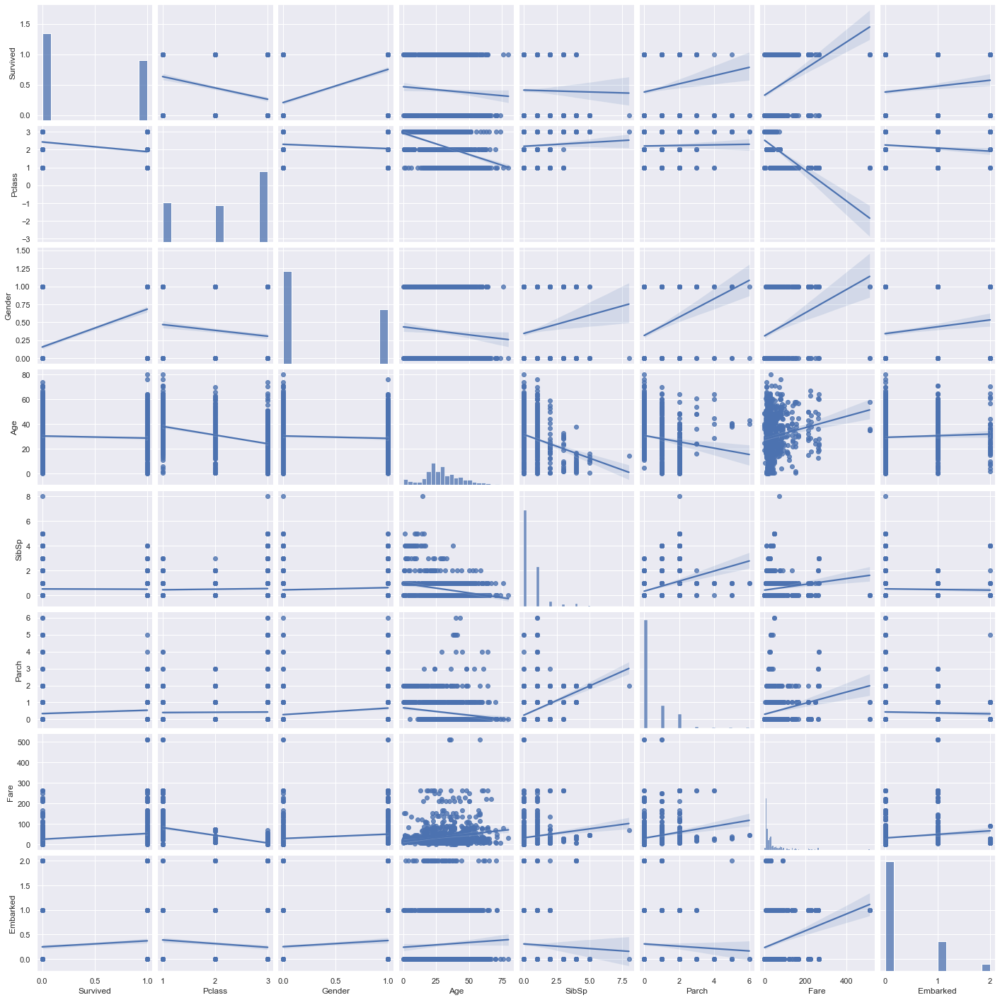

In [22]:
sns.pairplot(df_all_v1_copy, kind = "reg");

The plot above outputs the linear regression using two variables. We will try to predict Fare prices using the other columns. Initially, the variables Parcha nd SibSip seem to be the most predictive of Fare.

In [23]:
df_all_v1_copy.corr()

,Survived,Pclass,Gender,Age,SibSp,Parch,Fare,Embarked
Survived,1.000000,-0.317737,0.536332,-0.057416,-0.011403,0.115436,0.247858,0.108962
Pclass,-0.317737,1.000000,-0.141032,-0.409082,0.046333,0.016342,-0.564558,-0.113971
Gender,0.536332,-0.141032,1.000000,-0.066007,0.096464,0.222531,0.186400,0.109690
Age,-0.057416,-0.409082,-0.066007,1.000000,-0.242345,-0.149311,0.177205,0.050215
SibSp,-0.011403,0.046333,0.096464,-0.242345,1.000000,0.373960,0.142131,-0.031067
Parch,0.115436,0.016342,0.222531,-0.149311,0.373960,1.000000,0.217650,-0.036374
Fare,0.247858,-0.564558,0.186400,0.177205,0.142131,0.217650,1.000000,0.172281
Embarked,0.108962,-0.113971,0.109690,0.050215,-0.031067,-0.036374,0.172281,1.000000


<AxesSubplot:>

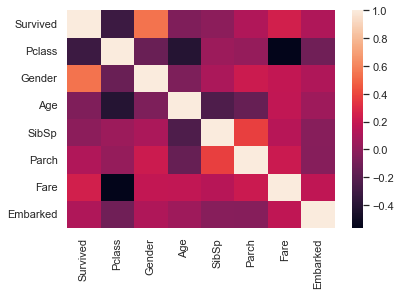

In [24]:
sns.heatmap(df_all_v1_copy.corr())

In the first place I do not think that the best way to predict the survival of a passanger is to use linear regression. Actually, even most of the features are not strongly linearly correlated with each other at all according to the correlation matrix. For Fare, we can see that the most significant correlation it has is with Pclass (-0.56 negative correlation), followed by Survived (0.247858) and Parc (0.2176). These numbers aren't even considered to be that good of a correlation.

I want to try another feature engineeing technique called permutation feature importances that indicates he importance of ouindependent variables in relation to our target variable, Fare. 

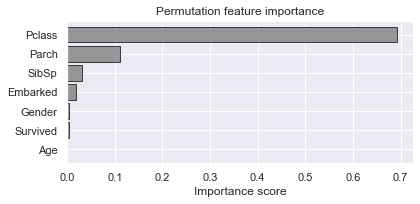

In [34]:
import rfpimp
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

X = df_all_v1_copy.drop(['Fare'],axis=1)
y = df_all_v1_copy["Fare"]
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.3, random_state = 42)

rf = LinearRegression(n_jobs=-1)
rf.fit(X_train, y_train)

imp = rfpimp.importances(rf, X_test, y_test)

fig, ax = plt.subplots(figsize=(6, 3))

ax.barh(imp.index, imp['Importance'], height=0.8, facecolor='grey', alpha=0.8, edgecolor='k')
ax.set_xlabel('Importance score')
ax.set_title('Permutation feature importance')
plt.gca().invert_yaxis()

fig.tight_layout()
plt.show();

The idea behind Permutation Feature selection is firstly taking a metric score for the model using all the features as predictors and then finding the MSE score. Then, we iterate through each predictor and randomizing one the values of one predictor at a time. The theory is that if the shuffling of values for one predictor yields an even greater MSE than the original MSE, then that feature has high predictive power, because "destroying" that feature  through shuffline made the score of the model worse. In this case, we can see that the most important feature is Pclass followed by Parch, then by SibSip, and then by Embarked. The features Gender, Survived, and Age are too insignificant to include in our model and may cause noise. We will pick the top 3 features and make our model based on that. Then we will try to creat another model using the top 3 highest correlating feature with Fare.

## Model 1: Using Pclass, Parch, and SibSip

In [35]:
#split the dataset
X = df_all_v1_copy[['Pclass', 'Parch', 'SibSp']]
y = df_all_v1_copy["Fare"]
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.3, random_state = 42)

In [36]:
lm = LinearRegression(n_jobs =-1)
lm.fit(X_train, y_train)

LinearRegression(n_jobs=-1)

In [37]:
lm.intercept_

114.1294308581

### Metrics. 

In [38]:
coef = pd.DataFrame(lm.coef_)
coef.columns = ['coef']
coef.index =X.columns
coef

,coef
Pclass,-38.250443
Parch,12.862140
SibSp,4.080898


Our function is the following:

$y = Pclass(-38.250443)+Parch(12.862140)+SibSp(4.080898)$

In [41]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
y_test_pred = lm.predict(X_test)

In [42]:
y_test_pred.shape, y_test.shape

((313,), (313,))

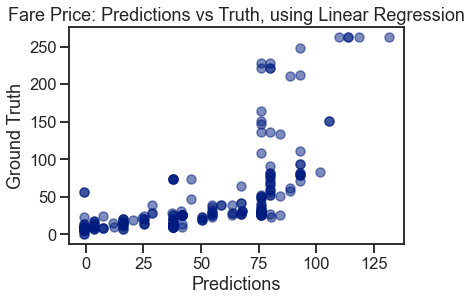

In [43]:
sns.set_context('talk')
sns.set_style('ticks')
sns.set_palette('dark')

ax = plt.axes()
# we are going to use y_test, y_test_pred
ax.scatter(y_test_pred, y_test, alpha=.5)

ax.set(xlabel='Predictions', 
       ylabel='Ground Truth',
       title='Fare Price: Predictions vs Truth, using Linear Regression');
plt.show()

It's very clear that the predictions and ground truths are far from each other. If they were close, then we would be seeing a more diagonal spread of the data.

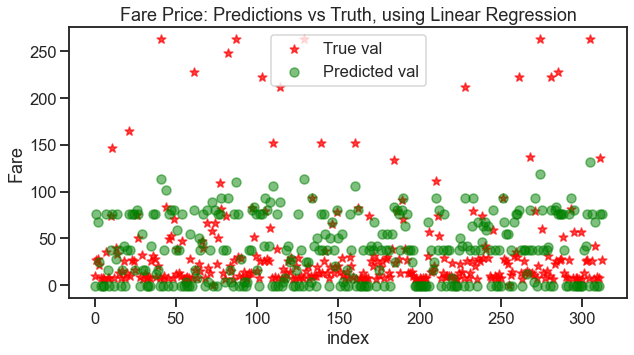

In [65]:
# create subplots
fig, ax = plt.subplots(figsize=(10,5))
x = [i for i in range (0,313)]
# create the 1st scatter plot of x_test and y_test
ax.scatter(x = x,y = y_test,label='True val',alpha = 0.7, c='red', marker='*')

# create the 2nd scatter plot of x_test and y_test_pred
ax.scatter( x = x, y = y_test_pred, c='green', label='Predicted val', alpha = 0.5)

# set the title of the plot
ax.set(title = "Fare Price: Predictions vs Truth, using Linear Regression", xlabel = "index",ylabel = "Fare");

ax.legend(loc = "best");

In [67]:
print("r_2 score is: {}".format(r2_score(y_test, y_test_pred)))
print("Mean squared error is: {}".format(mean_squared_error(y_test, y_test_pred)))
print("accuracy score is: {}".format(lm.score(X_test, y_test)))
print("Mean absolute error is: {}".format(mean_absolute_error(y_test, y_test_pred)))
print("root mean squared error is: {}".format(np.sqrt(mean_squared_error(y_test, y_test_pred))))

r_2 score is: 0.4429353789832178
Mean squared error is: 1456.4736027103556
accuracy score is: 0.4429353789832178
Mean absolute error is: 24.83613128527728
root mean squared error is: 38.16377343385158


## Model 2: Using Pclass, Parch, and Survived

In [69]:
#split the dataset
X = df_all_v1_copy[['Pclass', 'Parch', 'Survived']]
y = df_all_v1_copy["Fare"]
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.3, random_state = 42)

In [70]:
lm = LinearRegression(n_jobs =-1)
lm.fit(X_train, y_train)

LinearRegression(n_jobs=-1)

In [71]:
lm.intercept_

110.16652861443077

### Metrics. 

In [72]:
coef = pd.DataFrame(lm.coef_)
coef.columns = ['coef']
coef.index =X.columns
coef

,coef
Pclass,-36.791913
Parch,14.221046
Survived,5.573941


Our function is the following:

$y = Pclass(-36.791913)+Parch(14.221046)+Survived(5.573941)$

In [73]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
y_test_pred = lm.predict(X_test)

In [74]:
y_test_pred.shape, y_test.shape

((313,), (313,))

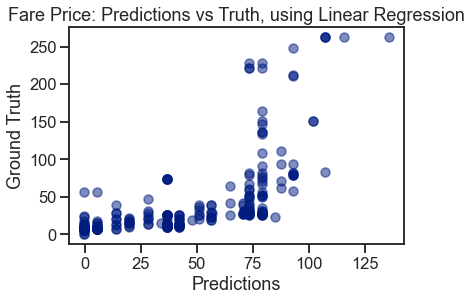

In [75]:
sns.set_context('talk')
sns.set_style('ticks')
sns.set_palette('dark')

ax = plt.axes()
# we are going to use y_test, y_test_pred
ax.scatter(y_test_pred, y_test, alpha=.5)

ax.set(xlabel='Predictions', 
       ylabel='Ground Truth',
       title='Fare Price: Predictions vs Truth, using Linear Regression');
plt.show()

It's very clear that the predictions and ground truths are far from each other. If they were close, then we would be seeing a more diagonal spread of the data.

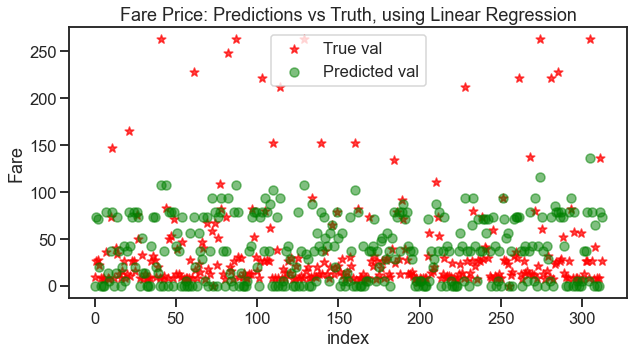

In [76]:
# create subplots
fig, ax = plt.subplots(figsize=(10,5))
x = [i for i in range (0,313)]
# create the 1st scatter plot of x_test and y_test
ax.scatter(x = x,y = y_test,label='True val',alpha = 0.7, c='red', marker='*')

# create the 2nd scatter plot of x_test and y_test_pred
ax.scatter( x = x, y = y_test_pred, c='green', label='Predicted val', alpha = 0.5)

# set the title of the plot
ax.set(title = "Fare Price: Predictions vs Truth, using Linear Regression", xlabel = "index",ylabel = "Fare");

ax.legend(loc = "best");

In [77]:
print("r_2 score is: {}".format(r2_score(y_test, y_test_pred)))
print("Mean squared error is: {}".format(mean_squared_error(y_test, y_test_pred)))
print("accuracy score is: {}".format(lm.score(X_test, y_test)))
print("Mean absolute error is: {}".format(mean_absolute_error(y_test, y_test_pred)))
print("root mean squared error is: {}".format(np.sqrt(mean_squared_error(y_test, y_test_pred))))

r_2 score is: 0.4272679517021142
Mean squared error is: 1497.436883084652
accuracy score is: 0.4272679517021142
Mean absolute error is: 25.02157947500277
root mean squared error is: 38.69672961743217


In [ ]:
print("r_2 score is: {}".format(r2_score(y_test, y_test_pred)))
print("Mean squared error is: {}".format(mean_squared_error(y_test, y_test_pred)))
print("accuracy score is: {}".format(lm.score(X_test, y_test)))
print("Mean absolute error is: {}".format(mean_absolute_error(y_test, y_test_pred)))
print("root mean squared error is: {}".format(np.sqrt(mean_squared_error(y_test, y_test_pred))))

r_2 score is: 0.4429353789832178
Mean squared error is: 1456.4736027103556
accuracy score is: 0.4429353789832178
Mean absolute error is: 24.83613128527728
root mean squared error is: 38.16377343385158


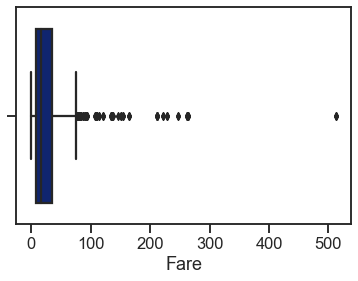

In [86]:
sns.boxplot(x=y, data = y);

Comparing Metrics
| Metric | Permutation | Correlation |
| --- | --- | --- |
| R^2 | 0.4429 | 0.4272 |
| MSE | 1456.4736|1497.43688|
|accuracy|0.44293|0.42726|
|MAE|24.836131|25.021579|
|RMSE|38.163773|38.69672961|

As we can see using the Permutation Feature Selection technique, we were able to get better metric scores, though not by a great margin, so the difference between the model seems negligble. 

* Generally, $R^2$ score explains the degree of which your x values explains the variation in your y values. A greater R^2 is preferrable. We have a very low R^2 score that is 0.44 and 0.42 for model 1 and 2, respectively. This number as a percentage relates to the amount of variation in the target column that can be explained by the features. 

* .score() for linear regression is The coefficient of determination can be thought of as a percent. It gives you an idea of how many data points fall within the results of the line formed by the regression equation. The higher the coefficient, the higher percentage of points the line passes through when the data points and line are plotted. Having a low .score() value suggest that not many points of the column, "Fare", fall within our regression lines for both models.

* MSE, MAE, and RMSE are are all loss functions that take into consideration how far the data lie from the regression line. MAE may not reflect performance well if the data is not normally distributed and if we have higher error values since outliers can affect the artihmetic mean which is essentially the final step for most of these loss functions after the error for each data point is calculated. RSME is more robust in this regard and reflects the performance well when dealing with high error values. Also, as seen in the Fare boxplot, this feature has many outliers that we cannot simple delete due to a loss of datapoints and also because the high Fare values are likely to be related with getting better lodging and accomodation, which could explain Survivability.We saw in our 2nd plot (index vs Fare) that most of the predicted values fall between 0-100, largely converging and forming bands for the 0, 50, and 100 Fare price. While most true values are between 0 - 50, there are a lot that are betweeen 50-250, which may cause large error values.  

# Part 2: Lab - Decision Tree Classification

Variable Description for Titanic Dataset
1. PassengerID: Unique identifier for each passenger
2. Survival: Did the passenger survive? (0 = No; 1 = Yes)
3. Pclass: Passenger ticket class. (1 = 1st; 2 = 2nd; 3 = 3rd)
4. Name: Name of the passenger. (last name, first name)
5. Gender: Male or female
6. Age: Age in years. Mostly integers with float values for children under one year.
7. SibSp: Number of siblings or spouse onboard.
8. Parch: Number of parents or children onboard.
9. Ticket: Ticket number
10. Fare: Amount paid for fare in pre-1970 British Pounds
11. Cabin: Cabin number
12. Embarked: Port of Embarkation (C = Cherbourg; Q = Queenstown; S = Southampton)

With the data above, what kinds of questions can we ask about the factors that contributed to passengers
surviving or perishing in the Titanic disaster?

    Where is the location of the lodging for the passengers belonging in their repective Pclass? Is 1st class lodging located at the top of ship, the 2nd class in the middle, and the 3rd class at the bottom? Were the females prioritized for safety during the tragedy over males? What is the distribution of the ages? Were the seniors and children given safety priority during the tragedy? Did the people with more siblings tend to face greater chance of mortality given that they probably were also busy worrying about their sublings aside from themselves? Did the people with more parents and more children tend to face greater chance of mortality given that they probably were also busy worrying about their children aside from themselves? What does the ticket number mean? Is it just a number or does it designate the rooms that the peopl are staying in and their priveleges? What advantages did people who paid for more fare get, or are the fares merely related to the distance for the passengers to the port of embarkation? Is there a correlation on how many personal belongings the passenger had based on their embarkation port?


In [2]:
import pandas as pd
train_df = pd.read_csv(r'C:\Users\core i5\Documents\GitHub\DataScience\datascience\CPE 019\titanic_train.csv')

In [3]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


Are there missing values in the data set?

    Yes there are 687 missing values for Cabin feature, 2 missing values for Embarked, and 177 missing values for Age feature.

In [7]:
# view the first few rows of the data
train_df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [9]:
# replace gender categorical variables into 0s and 1s
train_df["Sex"] = train_df["Sex"].apply(lambda x: 0 if x == "male" else 1)

In [10]:
train_df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",0,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",1,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",1,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",1,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",0,35.0,0,0,373450,8.0500,NaN,S


In [11]:
# fill in the missing values for Age
train_df.Age.fillna(train_df.Age.mean(), inplace = True)
print("the mean used was {}".format(train_df.Age.mean()))
train_df.Age.isnull().sum()

the mean used was 29.69911764705882


0

In [25]:
y_target = train_df['Survived']
columns = ["Fare","Age","Pclass","Sex","SibSp"]
X_input = train_df[columns]

In [26]:
from sklearn import tree
clf_train = tree.DecisionTreeClassifier(criterion="entropy", max_depth = 3)

clf_train = clf_train.fit(X_input, y_target)

In [27]:
clf_train.score(X_input, y_target)

0.8226711560044894

For the tree visualization, I will not follow the pdf since for some reason my computer does not recognize a module called `sklearn.externals.six` which is what was used in the pdf activity.

In [18]:
text_representation = tree.export_text(clf_train)
print(text_representation)

|--- feature_3 <= 0.50
|   |--- feature_0 <= 26.27
|   |   |--- feature_1 <= 13.50
|   |   |   |--- class: 1
|   |   |--- feature_1 >  13.50
|   |   |   |--- class: 0
|   |--- feature_0 >  26.27
|   |   |--- feature_4 <= 2.50
|   |   |   |--- class: 0
|   |   |--- feature_4 >  2.50
|   |   |   |--- class: 0
|--- feature_3 >  0.50
|   |--- feature_2 <= 2.50
|   |   |--- feature_0 <= 28.86
|   |   |   |--- class: 1
|   |   |--- feature_0 >  28.86
|   |   |   |--- class: 1
|   |--- feature_2 >  2.50
|   |   |--- feature_0 <= 23.35
|   |   |   |--- class: 1
|   |   |--- feature_0 >  23.35
|   |   |   |--- class: 0



In [19]:
with open("decistion_tree.log", "w") as fout:
    fout.write(text_representation)

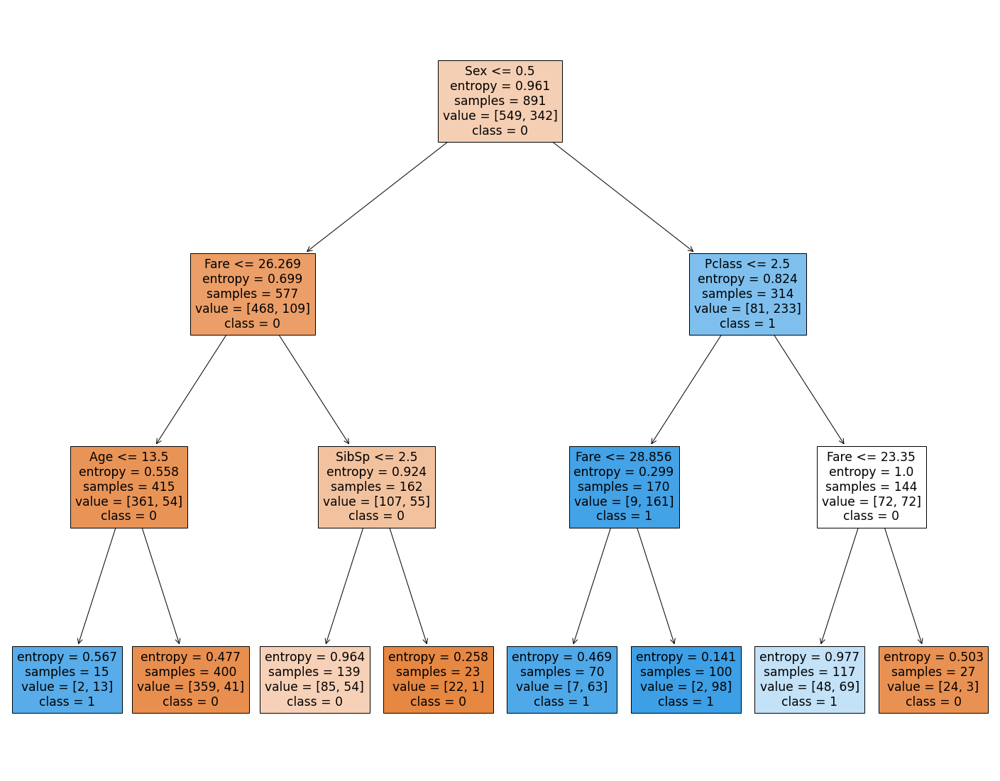

In [37]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(clf_train, 
                   feature_names=X_input.columns,  
                   class_names=["0","1"],
                   filled=True)

What describes the group that had the most deaths by number? Which group had the most survivors?

    According to our tree, the group that has the most deaths has 400 samples, having age <= 13.5, having a fare of 26.269, and are male. The group with the most survivors has members of 117 survivors, paid a fare of <=23.35, has a pclass of <=2.5, and are female.

In [39]:
#import the test data
test_df = pd.read_csv(r"C:\Users\core i5\Documents\GitHub\DataScience\datascience\CPE 019\titanic_test.csv")

print("There are about {} rows in the test data".format(test_df.shape[0]))

There are about 418 rows in the test data


In [40]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418 entries, 0 to 417
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  418 non-null    int64  
 1   Pclass       418 non-null    int64  
 2   Name         418 non-null    object 
 3   Sex          418 non-null    object 
 4   Age          332 non-null    float64
 5   SibSp        418 non-null    int64  
 6   Parch        418 non-null    int64  
 7   Ticket       418 non-null    object 
 8   Fare         417 non-null    float64
 9   Cabin        91 non-null     object 
 10  Embarked     418 non-null    object 
dtypes: float64(2), int64(4), object(5)
memory usage: 36.0+ KB


Which important variables are missing and how many are missng?

    